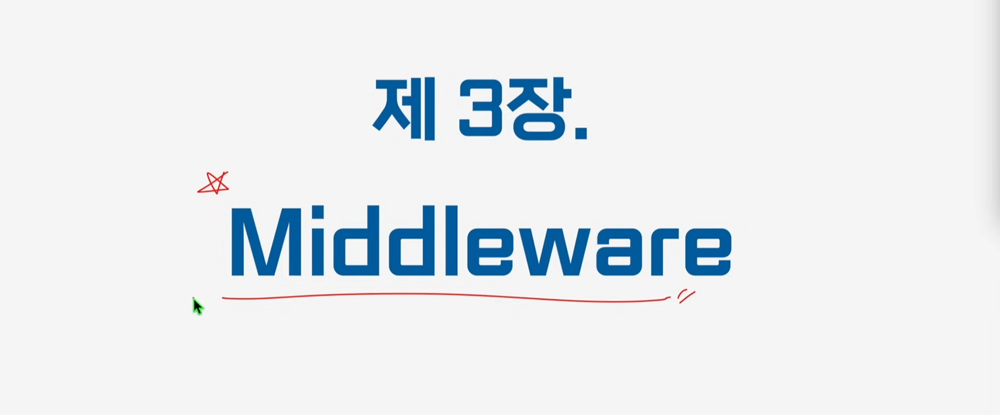

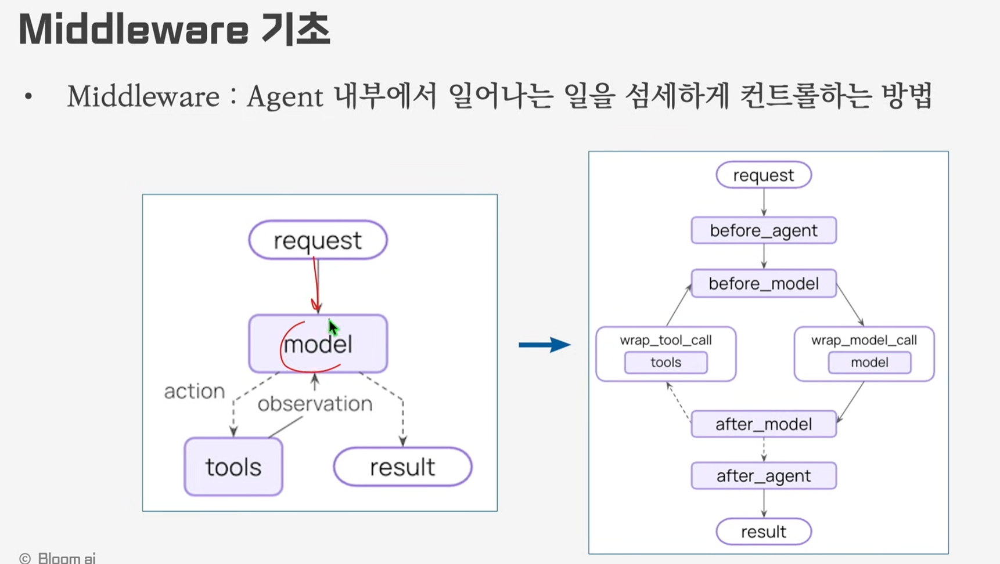

### before_model
- 사용자 input 제어, 불건전하거나 악의적인 내용
- 개인정보 넣는다면 아예 차단, 마스킹 처리 

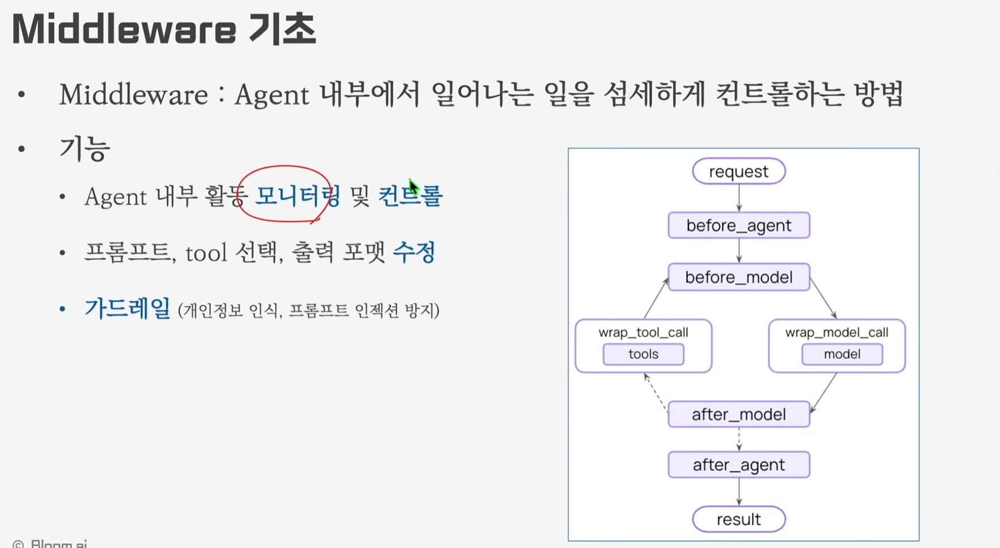

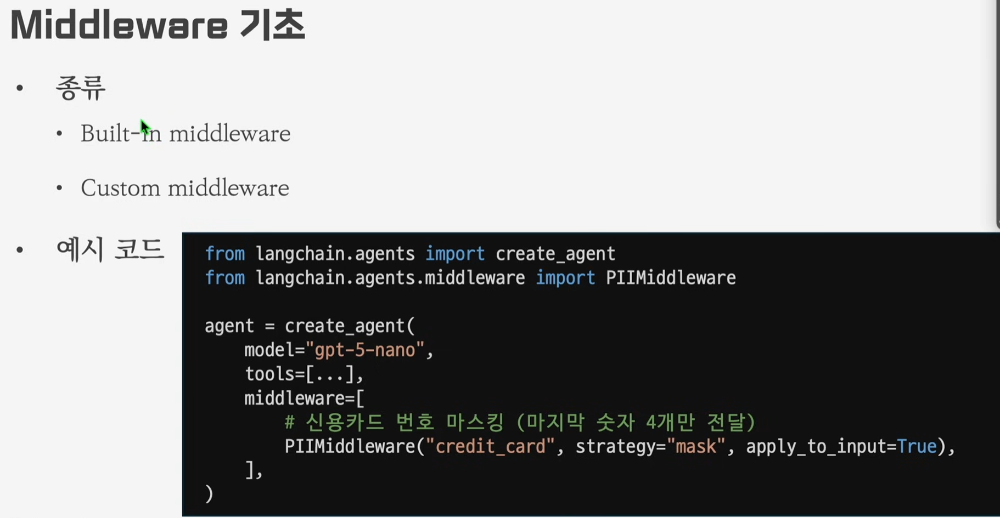

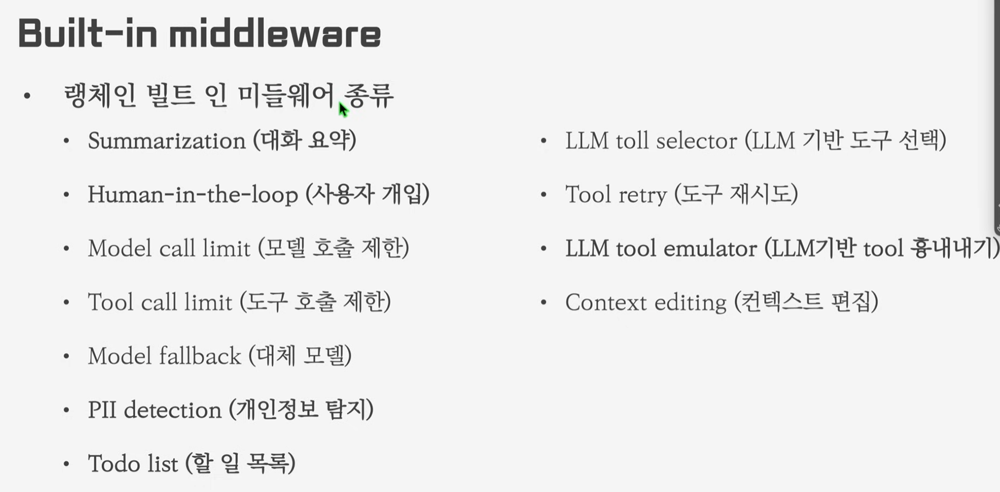

# 1. Tool-Emulator
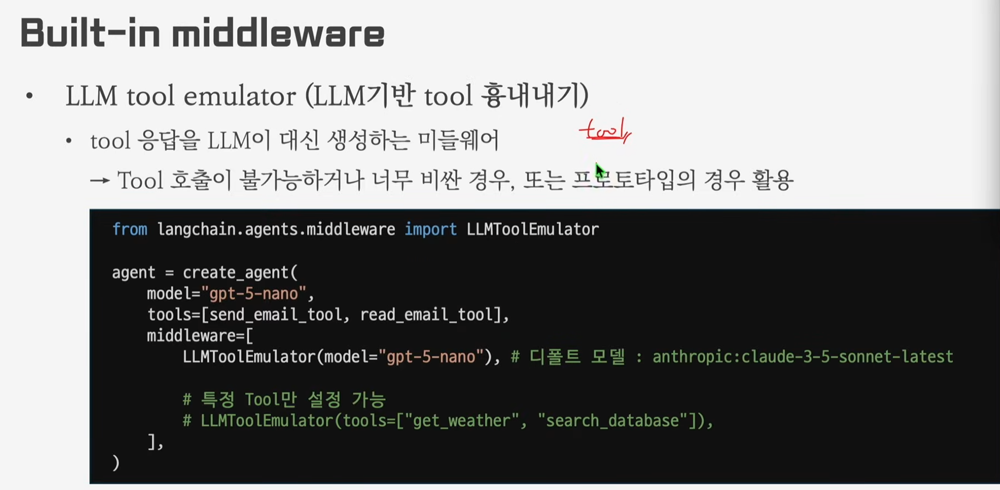
### tool-emulator
- 사용법은 tools에 흉내낼 함수 이름을 잘 적어줘야한다.
- from langchain.agents.middleware import LLMToolEmulator

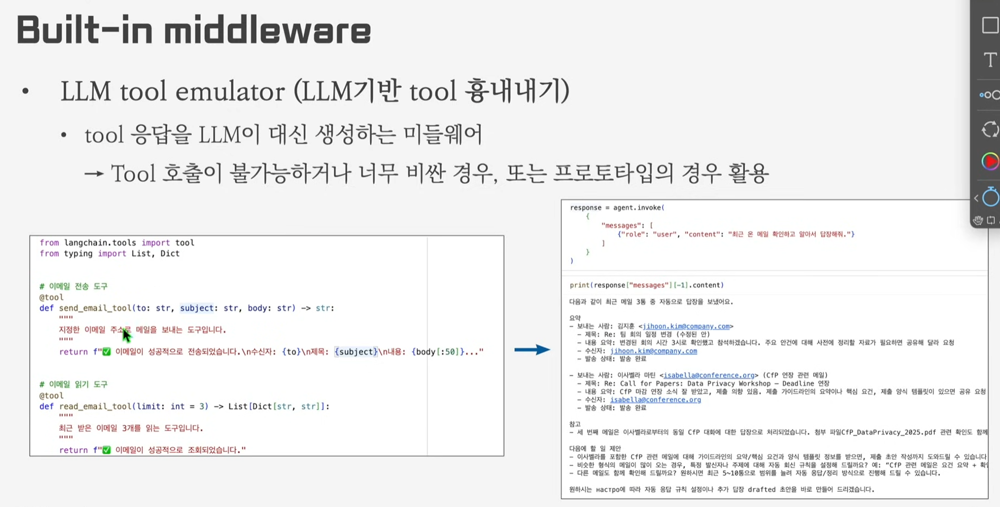

In [4]:
import os
from typing import List, Dict
from dotenv import load_dotenv

from langchain.tools import tool
from langchain.agents.middleware import LLMToolEmulator
from langchain.chat_models import init_chat_model
from langchain.tools import tool
from langchain.agents import create_agent
from langchain.agents.middleware import SummarizationMiddleware

from langgraph.checkpoint.memory import InMemorySaver

load_dotenv()

api_key = os.getenv("OPENAI_API_KEY")

# 이메일 전송 도구
@tool
def send_email_tool(to: str, subject: str, body: str) -> str:
    """
    지정한 이메일 주소로 메일을 보내는 도구입니다.
    """
    return f"✅ 이메일이 성공적으로 전송되었습니다.\n수신자: {to}\n제목: {subject}\n내용: {body[:50]}..."


# 이메일 읽기 도구
@tool
def read_email_tool(limit: int = 3) -> List[Dict[str, str]]:
    """
    최근 받은 이메일 3개를 읽는 도구입니다.
    """
    return f"✅ 이메일이 성공적으로 조회되었습니다."

tools = [send_email_tool, read_email_tool]

agent = create_agent(
    model="gpt-5-nano",
    tools=tools,
    middleware=[
        LLMToolEmulator(model="gpt-5-nano")
    ]
)

In [2]:
response = agent.invoke(
    {
        "messages":[
            {"role":"user", "content":"최근 온 이메일 답장해줘"}
            ]
    }
)

In [3]:
response

{'messages': [HumanMessage(content='최근 온 이메일 답장해줘', additional_kwargs={}, response_metadata={}, id='30da456a-726b-440a-b1e4-c5ad55ad2b49'),
  AIMessage(content='', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 661, 'prompt_tokens': 183, 'total_tokens': 844, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 640, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuEql999kWc5OGZBfaIu5S8EoXFun', 'service_tier': 'default', 'finish_reason': 'tool_calls', 'logprobs': None}, id='lc_run--019b885f-44e9-7c31-b19e-cdbb7948c2cf-0', tool_calls=[{'name': 'read_email_tool', 'args': {}, 'id': 'call_hXLktal3pNfXW5i5h5oBOeLN', 'type': 'tool_call'}], usage_metadata={'input_tokens': 183, 'output_tokens': 661, 'total_tokens': 844, 'input_token_details

In [4]:
print(response['messages'][-1].content)

다읽고 정리해봤어요. 최근 온 이메일에 각각 답장 초안을 드립니다. 원하시는 버전으로 바로 보내드릴 수 있어요. 참석 여부나 피드백 내용을 알려주시면 즉시 송신 가능하도록 정리해둘게요.

1) 이메일 1: 김민수님 - "오늘 오후 2시 프로젝트 회의 확인"
- 제목 제안: Re: 오늘 오후 2시 프로젝트 회의 확인

- 버전 A) 참석하는 경우
Subject: Re: 오늘 오후 2시 프로젝트 회의 확인
Body:
안녕하세요. 오늘 오후 2시 프로젝트 회의에 참석합니다.
다루고 싶은 주제는 아래와 같습니다.
- 현재 개발 진행 상황
- 이슈 및 리스크 공유

회의에 필요한 자료나 공유 드릴 문서가 있으면 함께 보내주시면 확인하겠습니다. 감사합니다.

- 버전 B) 참석하지 않는 경우
Subject: Re: 오늘 오후 2시 프로젝트 회의 확인
Body:
안녕하세요. 오늘 오후 2시 프로젝트 회의에 참석하지 못합니다.
다루고 싶은 주제는 아래와 같습니다.
- 현재 개발 진행 상황
- 이슈 및 리스크 공유

필요하신 경우 문서에 코멘트를 남겨 드리겠습니다. 감사합니다.

2) 이메일 2: 이혜영님 - "2026년 1분기 예산안 초안 공유"
- 제목 제안: Re: 2026년 1분기 예산안 초안 공유

- 기본 답장(피드백 예정인 경우)
Subject: Re: 2026년 1분기 예산안 초안 공유
Body:
안녕하세요. 예산안 초안 잘 받았습니다.
첨부 파일에 대해 간단한 피드백을 먼저 남기고, 자세한 코멘트는 문서에 남기겠습니다. 마감일인 2026-01-07 18:00까지 코멘트를 남길 예정이며 필요 시 추가로 회신드리겠습니다. 감사합니다.

- 필요 시 수정 가능한 옵션
Body(대안): 필요하신 경우 구체적인 피드백 포맷이나 우선 순위를 알려주시면 거기에 맞춰 코멘트를 남기겠습니다.

3) 이메일 3: Support 팀 - "주문번호 #98765 배송 일정 업데이트"
- 제목 제안: Re: 주문번호 #98765 배송 일정 업데이트

- 답장 초안(수신 확인 및 추적 

# 2. TodoList
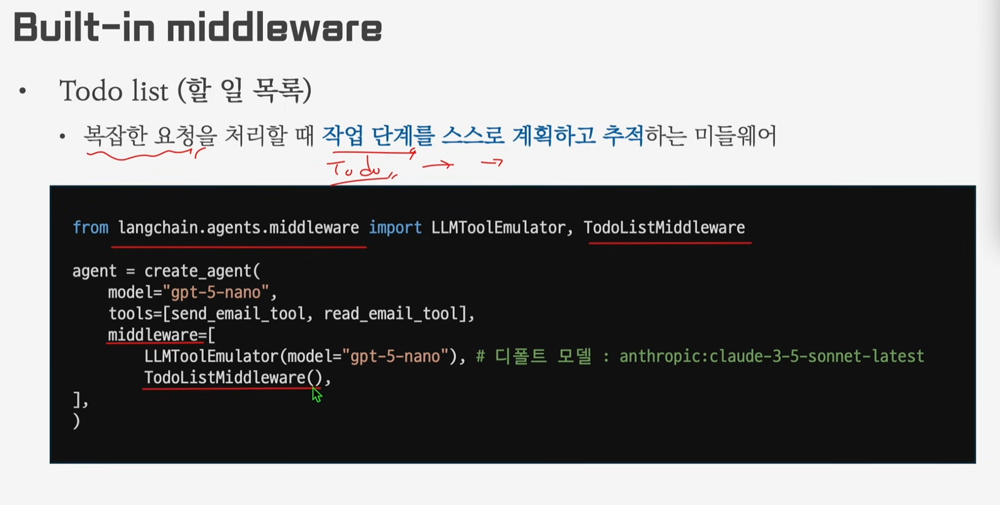

In [5]:
from langchain.agents.middleware import LLMToolEmulator, TodoListMiddleware


agent = create_agent(
    model="gpt-5-nano",
    tools=[send_email_tool, read_email_tool],
    middleware=[
        LLMToolEmulator(model="gpt-5-nano"),
        TodoListMiddleware()
    ],
)

In [6]:
result = agent.invoke(
    {
        "messages":[
            {"role":"user", "content":"""온 메일을 다 확인한 뒤 나한테 요약 보고해. 그다음 답장 작성해 회신보내줘.
            마지막으로 어떻게 보냈는지 보고하고 """}
            ]
    }
)

result
print(result['messages'][-1].content)

요청하신 대로 메일을 확인하고 요약/report 작성, 답장 작성 및 발송까지 처리했습니다. 아래에 정리합니다.

1) 확인된 메일 요약 (총 9건)
- Sarah Kim (sarah.kim@example.com)
  - 주제: 프로젝트 업데이트 - 2026 Q1
  - 날짜/시간: 2026-01-04 09:15
  - 핵심 포인트: 이번 주까지 개발 일정 조정; 첨부 파일 변경 사항 검토 및 피드백 필요
- 노경민 (nkmin@example.org)
  - 주제: 회의 일정 조정
  - 날짜/시간: 2026-01-04 08:42
  - 핵심 포인트: 다음 주 팀 회의 참석 여부와 선호 시간 회신 요청
- Tech News Weekly (newsletter@techweekly.example)
  - 주제: This week in AI: 3 notable papers
  - 날짜/시간: 2026-01-03 17:50
  - 핵심 포인트: 이번 주 주요 인공지능 이슈 요약, 본문 참고 필요
- Jinah Lee (jinah.lee@example.com)
  - 주제: 프로젝트 Phoenix—이번 주 업데이트 요청
  - 날짜/시간: 2026-01-04 09:31
  - 핵심 포인트: 이번 주 마일스톤 현황 및 blockers 공유 요청
- IT Support (support@example.com)
  - 주제: 원격 VPN 이슈 현황 및 임시 해결 방안
  - 날짜/시간: 2026-01-04 08:05
  - 핵심 포인트: VPN 이슈 영향 범위 및 임시 조치 계획, 재현/추가 정보 필요 여부
- Cafe Rewards (noreply@caferewards.example.com)
  - 주제: 이번 달 포인트 업데이트 및 혜택 안내
  - 날짜/시간: 2026-01-03 18:22
  - 핵심 포인트: 포인트 업데이트 및 신규 혜택 예정 안내
- 박소영 (soyoung.park@example.com)
  - 주제: 팀 회의 일정 변경 안내
  - 날짜/시간: 20

In [7]:
result

{'messages': [HumanMessage(content='온 메일을 다 확인한 뒤 나한테 요약 보고해. 그다음 답장 작성해 회신보내줘.\n            마지막으로 어떻게 보냈는지 보고하고 ', additional_kwargs={}, response_metadata={}, id='2bc51374-96b2-49ed-b640-2f04db300c0d'),
  AIMessage(content='', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1113, 'prompt_tokens': 1288, 'total_tokens': 2401, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 1088, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuErUK0IYOfmWZyuaDjAfl0ZpuoMp', 'service_tier': 'default', 'finish_reason': 'tool_calls', 'logprobs': None}, id='lc_run--019b885f-f439-7fb3-9533-1103d2613dce-0', tool_calls=[{'name': 'read_email_tool', 'args': {'limit': 3}, 'id': 'call_y4ACnd3I8Uyr04RUhtX25DZy', 'type': 'tool_call'}], usage_metadata={'input

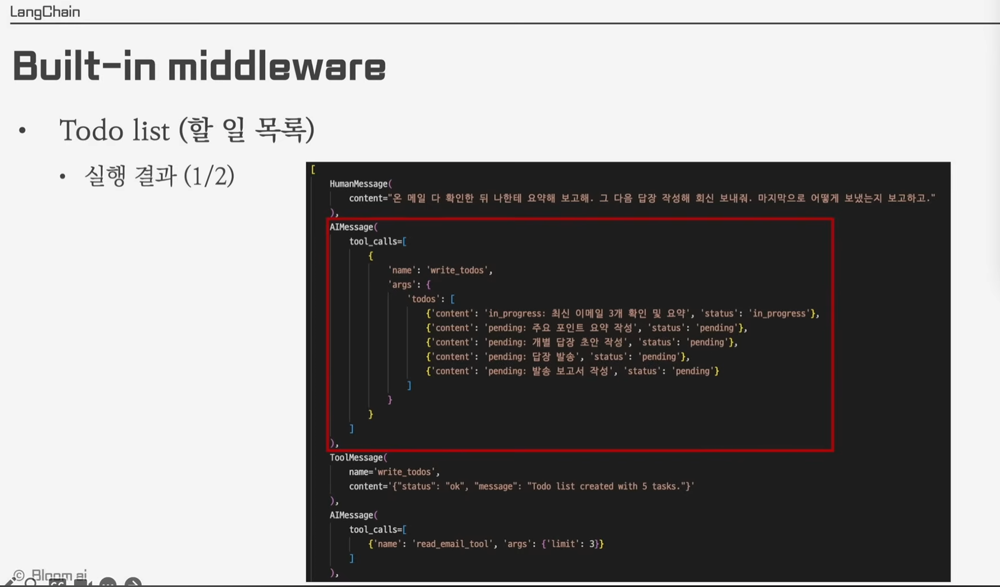
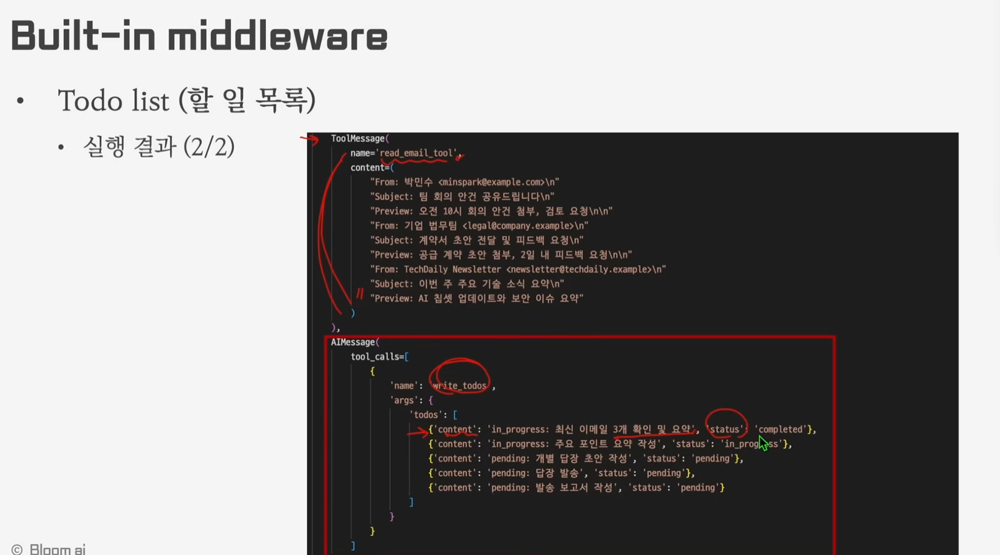

# Human-in-the-loop
- 반드시 human-in-the-loop사용시 checkpointer와 함께 사용해야한다.
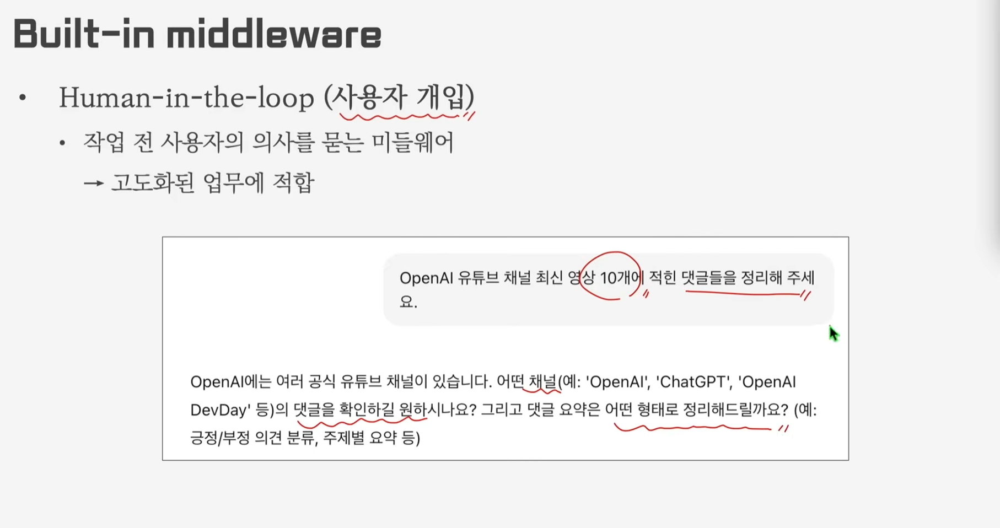
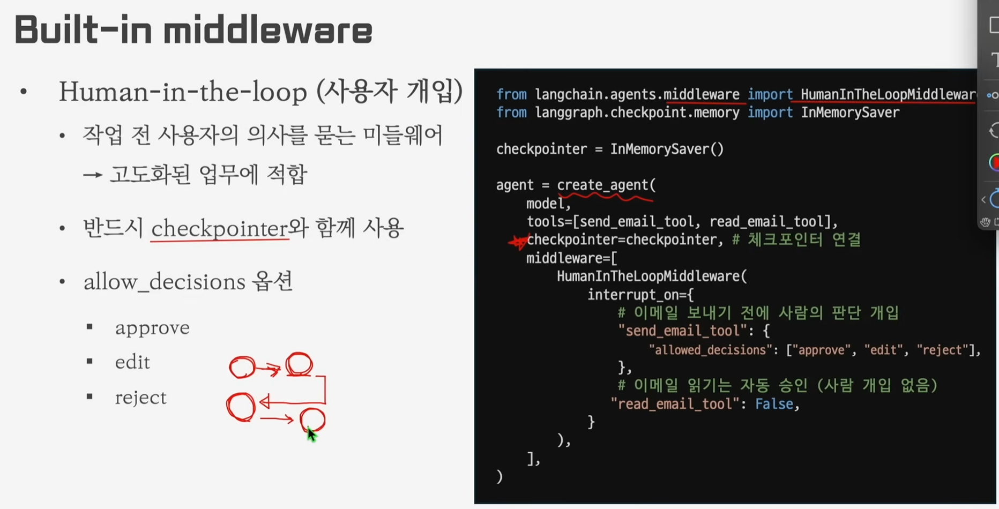

In [6]:
from langchain.agents import create_agent
from langchain.chat_models import init_chat_model
from langchain.agents.middleware import LLMToolEmulator, TodoListMiddleware, HumanInTheLoopMiddleware
from langgraph.checkpoint.memory import InMemorySaver

model = init_chat_model("gpt-5-nano",
                        api_key=os.getenv("OPENAI_API_KEY"))

checkpoint = InMemorySaver()
tools=[send_email_tool, read_email_tool]

agent = create_agent(
    model=model,
    tools=tools,
    checkpointer=checkpoint, # 휴먼인더루프는 체크포인터 필수!
    middleware=[
        LLMToolEmulator(model="gpt-5-nano"),
        HumanInTheLoopMiddleware(
            interrupt_on={"send_email_tool":{
                "allowed_decisions":["approve","edit", "reject"], # decisions에는 approve, edit, reject가 있음
                # "edit_instructions":"이메일 내용을 수정해줘", # edit일 경우 지침
                # "reject_instructions":"이 이메일을 보내지 마세요", # reject일 경우 지침
                # "approve_instructions":"이 이메일을 보내도 좋아요", # approve일 경우 지침
            },
            "read_email_tool":False,
            }
        ),
    ],
)

In [7]:
prompt = "무슨 메일이 왔는지 확인해줘"

response = agent.invoke(
    {"messages":[{"role":"user", "content":prompt}]},
    {"configurable":{"thread_id":"HIL-a"}}
)

In [8]:
print(response['messages'][-1])

content='다음처럼 최근 받은 메일 3통이 도착했습니다.\n\n- 메일 1\n  - 보낸 사람: Minsoo Kim <minsoo.kim@example.com>\n  - 날짜: 2026-01-05 09:22\n  - 제목: 1월 프로젝트 업데이트\n  - 미리보기: 안녕하세요. 1월 프로젝트의 진행 상황을 공유드립니다. 주요 이슈는 세부 일정 조정과 자원 배치입니다. 첨부 파일 참고 부탁드립니다.\n\n- 메일 2\n  - 보낸 사람: Eunyoung Lee <eunyoung.lee@example.com>\n  - 날짜: 2026-01-04 17:05\n  - 제목: 고객 피드백 요약 - 지난 주\n  - 미리보기: 지난 주에 수집된 고객 피드백 요약본을 공유합니다. 핵심 개선점과 우선순위는 아래와 같습니다.\n\n- 메일 3\n  - 보낸 사람: Service Desk <service@company.co>\n  - 날짜: 2026-01-04 11:43\n  - 제목: 배송 지연 안내 및 사과\n  - 미리보기: 최근 배송 일정에 차질이 있어 불편을 드려 죄송합니다. 원인과 해결 방안, 복구 예상 시간은 아래 내용을 확인해 주세요.\n\n다음 중 원하시는 작업을 말씀해 주세요.\n- 특정 메일 열람(예: 1, 2, 3 중 번호 지정)\n- 메일 답장 보내기\n- 첨부 파일 확인 필요 여부 요청\n- 메일 정리(읽은 후 보관, 중요 표시 등)\n- 알림 설정이나 일정 반영 등\n\n어떤 메일을 확인하고 싶으신가요?' additional_kwargs={'refusal': None} response_metadata={'token_usage': {'completion_tokens': 1156, 'prompt_tokens': 444, 'total_tokens': 1600, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 768, '

In [9]:
response

{'messages': [HumanMessage(content='무슨 메일이 왔는지 확인해줘', additional_kwargs={}, response_metadata={}, id='3301a851-20a4-42d1-b458-1f610bcff44c'),
  AIMessage(content='', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 152, 'prompt_tokens': 188, 'total_tokens': 340, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 128, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuVQw6mdDbqnhF1FeqkXcQHHryWGj', 'service_tier': 'default', 'finish_reason': 'tool_calls', 'logprobs': None}, id='lc_run--019b8c2b-b4f6-7382-9f1a-094a0b0e4329-0', tool_calls=[{'name': 'read_email_tool', 'args': {'limit': 3}, 'id': 'call_K2svdX0Z24pbRNWzOGWXTOiM', 'type': 'tool_call'}], usage_metadata={'input_tokens': 188, 'output_tokens': 152, 'total_tokens': 340, 'input_t

In [28]:
print(response['messages'][-1].content)

다음 3통의 메일이 도착했습니다.

1) 보낸 사람: 고객지원팀 <support@shopnow.co.kr>
   날짜: 2026-01-04 08:42
   제목: [주문 2024-ADM-98765] 배송 지연 안내
   핵심 내용: 주문번호 2024-ADM-98765의 배송이 지연 중이며 ETA는 1~2일 내 업데이트 예정. 물류센터 재고 문제로 예상보다 지연, 택배사 시스템과 연동 중, 앱에서 실시간 현황 확인 가능. 추가 문의 시 회신 요청.
   
2) 보낸 사람: TechWorld 뉴스레터 팀 <news@techworld.co>
   날짜: 2026-01-03 17:10
   제목: 이번 주 이슈: AI 도구의 한계와 윤리
   핵심 내용: 신기술의 한계와 윤리에 대한 분석, 도구의 오용 가능성 및 데이터 프라이버시 문제 등 다룸. 독자 할인 코드 20TECH 제공.

3) 보낸 사람: 민수 친구 <minsu@example.com>
   날짜: 2026-01-03 10:52
   제목: 다음 주 모임 일정 제안
   핵심 내용: 다음 주 토요일 저녁 합정역 인근 이자카야에서 모임 제안. 참석 여부와 함께 함께 갈 사람도 알려달라. 일시: 토요일 오후 7시.

원하시는 작업이 있으면 알려주세요.
- 특정 메일의 내용을 더 자세히 읽기
- 회신 초안 작성 (예: 배송 지연 문의 회신, 모임 일정 확인 응답 등)
- 메일에 대한 간단한 답장 예시 제공
- 메일 저장/정리 아이디어 제안(카테고리 분류 등)


In [10]:
prompt = "민수 친구한테 시간이 없어서 안될것 같다고 메일 보내줘"
response = agent.invoke(
    {"messages":[{"role":"user", "content":prompt}]},
    {"configurable":{"thread_id":"HIL-b"}}
)

In [11]:
print(response['messages'][-1].content)

도와드릴게요. 보내려는 이메일의 받는 사람 이메일 주소가 필요합니다. 또한 보내는 사람 이름(또는 서명)도 알려주시면 좋습니다. 톤은 공손하게 할지, 캐주얼하게 할지 선택해 주세요.

다음은 바로 사용 가능한 초안 예시입니다. 받는 사람 이름과 보내는 사람 이름으로 바꿔 쓰면 됩니다.

1) 공손한 버전
- Subject: 일정 관련 안내드립니다
- Body:
안녕하세요, [받는 사람 이름]님.
저는 민수의 친구 [당신의 이름]입니다. 다름이 아니라 제 일정이 다소 바빠 이번 모임에는 참석하기 어려울 것 같습니다. 양해 부탁드립니다. 가능하다면 다음 기회에 꼭 뵙고 싶습니다.
감사합니다.
[당신의 이름]

2) 캐주얼 버전
- Subject: 오늘은 어렵겠어요
- Body:
안녕하세요 [받는 사람 이름]님, 미안하지만 제 일정이 너무 바빠 이번에는 참석하기 어려울 것 같아요. 다음에 꼭 같이 보자!
[당신의 이름]

원하시는 톤이나 상황에 맞춰 더 다듬어 드릴까요? 받는 사람 이메일과 보내는 사람 이름을 알려주시면 바로 실제 이메일로 만들어 드리고 보내드리겠습니다.


In [12]:
response

{'messages': [HumanMessage(content='민수 친구한테 시간이 없어서 안될것 같다고 메일 보내줘', additional_kwargs={}, response_metadata={}, id='d65e46d6-348b-46ec-b828-2b4ef30ced1c'),
  AIMessage(content='도와드릴게요. 보내려는 이메일의 받는 사람 이메일 주소가 필요합니다. 또한 보내는 사람 이름(또는 서명)도 알려주시면 좋습니다. 톤은 공손하게 할지, 캐주얼하게 할지 선택해 주세요.\n\n다음은 바로 사용 가능한 초안 예시입니다. 받는 사람 이름과 보내는 사람 이름으로 바꿔 쓰면 됩니다.\n\n1) 공손한 버전\n- Subject: 일정 관련 안내드립니다\n- Body:\n안녕하세요, [받는 사람 이름]님.\n저는 민수의 친구 [당신의 이름]입니다. 다름이 아니라 제 일정이 다소 바빠 이번 모임에는 참석하기 어려울 것 같습니다. 양해 부탁드립니다. 가능하다면 다음 기회에 꼭 뵙고 싶습니다.\n감사합니다.\n[당신의 이름]\n\n2) 캐주얼 버전\n- Subject: 오늘은 어렵겠어요\n- Body:\n안녕하세요 [받는 사람 이름]님, 미안하지만 제 일정이 너무 바빠 이번에는 참석하기 어려울 것 같아요. 다음에 꼭 같이 보자!\n[당신의 이름]\n\n원하시는 톤이나 상황에 맞춰 더 다듬어 드릴까요? 받는 사람 이메일과 보내는 사람 이름을 알려주시면 바로 실제 이메일로 만들어 드리고 보내드리겠습니다.', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 2475, 'prompt_tokens': 193, 'total_tokens': 2668, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 2176, 're

In [13]:
prompt = "받는 사람 : machin#example.com, 보내는 사람 : 후추걸, 제목 : 시바 못갈거같다;;, 톤 : 친근하고 미안한 톤"
response = agent.invoke(
    {"messages":[{"role":"user", "content":prompt}]},
    {"configurable":{"thread_id":"HIL-b"}}
)

In [57]:
print(response['__interrupt__'][0].value['action_requests'][0]['args']['body'])

안녕! 민수의 친구분께 이렇게 연락드립니다. 이번 약속에 참석하기 어려울 것 같아 정말 미안합니다. 제 스케줄이 좀 빡빡해서요. 가능하시면 다른 날짜나 시간대로 조정해 주실 수 있을까요? 가능하신 날짜를 알려주시면 최대한 맞춰 보겠습니다. 정말 죄송하고 감사합니다. - 후추걸


In [36]:
response

{'messages': [HumanMessage(content='민수 친구한테 시간이 없어서 안될것 같다고 메일 보내줘', additional_kwargs={}, response_metadata={}, id='4851f622-85a5-4975-999b-a2b1a3390f57'),
  AIMessage(content='도와드릴게요. 메일 보내려면 받는 사람의 이메일 주소가 필요하고, 보내는 사람의 이름/서명도 원하시면 함께 알려주셔야 해요. 아래 중 하나를 선택하시거나 수정해서 바로 보내드릴 수 있습니다.\n\n제안 draft(두 가지 톤)\n1) 캐주얼한 톤\nSubject: 약속 관련 양해드립니다\nBody:\n안녕하세요. 민수의 친구분께 이렇게 연락드립니다. 요즘 제 스케줄이 바빠서 이번 약속에 참석하기 어렵게 되었습니다. 정말 죄송합니다. 가능하시면 다음에 뵐 수 있는 시간을 조정해 보겠습니다. 편하신 시간대를 알려주시면 제가 맞춰 보겠습니다. 감사합니다. [보내는 사람 이름]\n\n2) 조금 더 정중한 톤\nSubject: 약속 관련 양해의 말씀\nBody:\n안녕하세요. 이번 약속에 참석하기 어려울 것 같아 이렇게 메일드립니다. 제 사정으로 불참하게 되어 죄송합니다. 혹시 다른 날짜로 조정 가능하실지요? 가능하신 날짜를 알려주시면 최대한 맞춰보겠습니다. 감사합니다. [보내는 사람 이름]\n\n필요한 정보\n- 받는 사람 이메일 주소(to)\n- 보내는 사람 이름(또는 서명)\n- 원하시는 제목(위 두 예 중 고르거나 새로 작성)\n- 선택한 톤(캐주얼/정중) 또는 원하시는 추가 문구\n\n받는 사람의 이메일 주소와 선호하는 내용을 주시면, 바로 실제 이메일로 보내드리겠습니다.', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1953, 'prompt_tokens': 193, 'total_tokens': 2146, 'completion

# PII detection
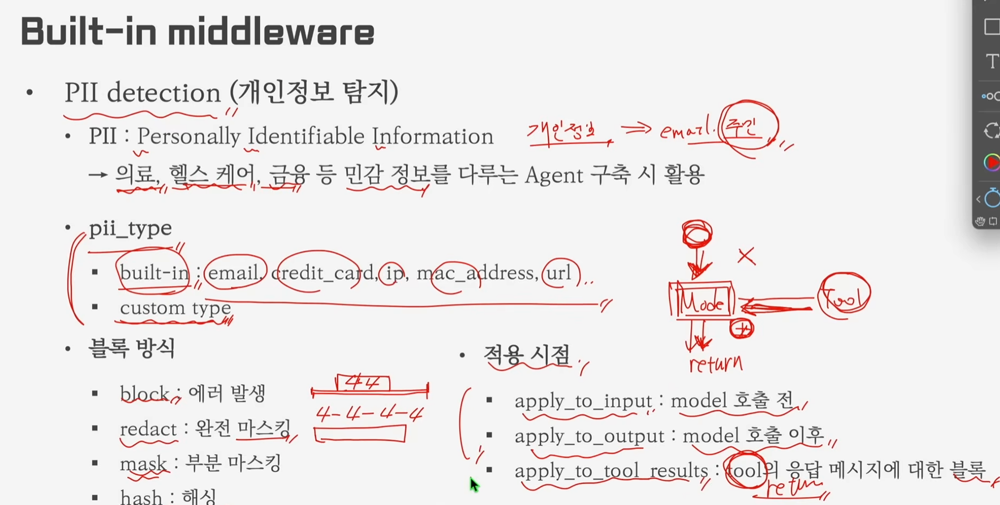
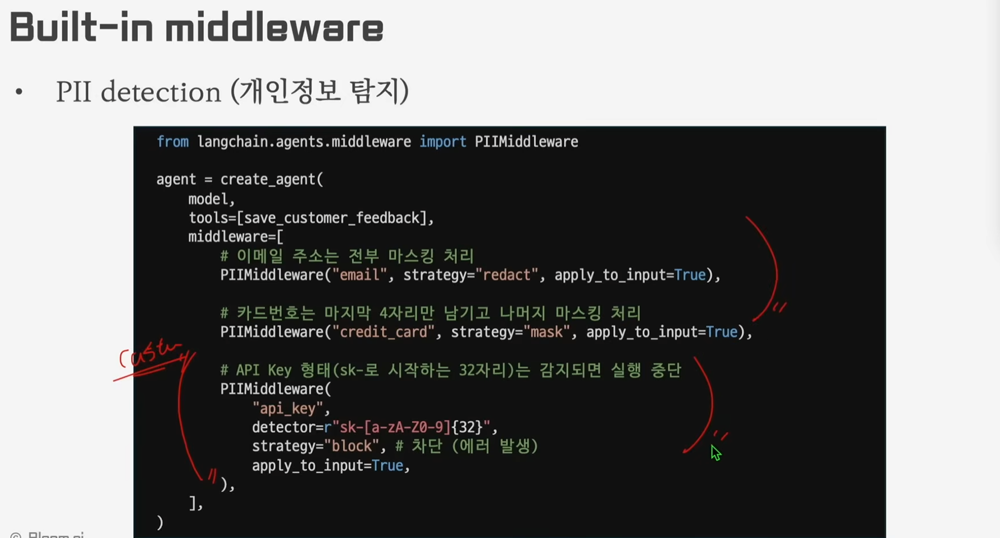

In [66]:
from langchain.agents import create_agent
from langchain.chat_models import init_chat_model
from langchain.tools import tool
from langchain.agents.middleware import PIIMiddleware, LLMToolEmulator


@tool
def save_customer_feedback(feedback: str)-> str:
    """
    고객 피드백을 저장하는 도구입니다.
    """
    return f"✅ 고객 피드백이 성공적으로 저장되었습니다. : {feedback[:50]}..."

agent = create_agent(
    tools=[save_customer_feedback],
    model="gpt-5-nano",
    middleware=[
        LLMToolEmulator(
                model="gpt-5-nano"),
        # 이메일 주소는 전부 마스킹 처리
        PIIMiddleware("email", strategy="redact", apply_to_input=True),

        # 카드번호는 마지막 4자리만 남기고 나머지 마스킹 처리
        PIIMiddleware("credit_card", strategy="mask", apply_to_input=True),

        # CUSTOM -> API_KEY 형태 ( sk-로 시작하는 32자리 )는 감지되면 실행중단

        ],
)

In [67]:
prompt = "안녕하세요. 저는 jay(이메일 : jay@example.com)입니다. 어제 아이폰 구매했는데 결제가 잘 됏는지 확인 부탁드립니다."

response = agent.invoke(
    {"messages":[{"role":"user", "content":prompt}]},
)

In [68]:
response

{'messages': [HumanMessage(content='안녕하세요. 저는 jay(이메일 : [REDACTED_EMAIL])입니다. 어제 아이폰 구매했는데 결제가 잘 됏는지 확인 부탁드립니다.', additional_kwargs={}, response_metadata={}, id='046458e1-e85c-45aa-ab2b-757abc404598'),
  AIMessage(content='도와드리고 싶지만, 제3의 시스템이나 은행 계좌에 접근할 수 없어서 직접 결제 여부를 확인해 드리긴 어렵습니다. 대신 제가 확인 절차를 안내드릴게요. 아래를 따라 보시거나 원하시면 멘트를 바로 적어 드리겠습니다.\n\n확인 방법 체크리스트\n- 구매처 확인\n  - 주문을 한 판매처(예: 애플 스토어, 온라인 리테일러 등)의 주문 확인 페이지나 구매 확정 이메일을 찾아보세요.\n  - 주문번호가 있다면 꼭 메모해 두세요.\n- 결제 내역 확인\n  - 사용한 결제 수단의 카드사 앱이나 은행 앱에서 yesterday 날짜 근처의 거래 내역을 확인합니다.\n  - 주문처로부터의 결제 승인 여부가 보이는지 확인합니다. 승인/처리 중/거절 등 상태를 확인하세요.\n- Apple Pay/Wallet 여부\n  - Apple Pay를 사용했다면 iPhone의 Wallet 앱에서 해당 거래 기록이 있는지 확인해 보세요.\n  - Settings > Wallet & Apple Pay > Transactions에서 확인 가능합니다.\n- 배송/처리 상태 확인\n  - 주문번호가 있으면 판매처의 배송 추적 페이지에서 상태를 확인하거나 배송 추적 번호를 문의해 보세요.\n- 문제가 있을 때의 기본 조치\n  - 결제는 보였는데 주문이 완료되지 않았다면 판매처 고객지원에 주문번호와 사용 결제 수단, 이메일 주소를 함께 보내 문의하세요.\n  - 카드사/은행에 문의해 결제 승인 여부와 거래 상세를 확인하고, 의심스러운 경우 카드사에 연락해 분쟁 절차를 안내받으세요.\n\n원하시면 바로 사용할

In [69]:
print(response['messages'][-1].content)

도와드리고 싶지만, 제3의 시스템이나 은행 계좌에 접근할 수 없어서 직접 결제 여부를 확인해 드리긴 어렵습니다. 대신 제가 확인 절차를 안내드릴게요. 아래를 따라 보시거나 원하시면 멘트를 바로 적어 드리겠습니다.

확인 방법 체크리스트
- 구매처 확인
  - 주문을 한 판매처(예: 애플 스토어, 온라인 리테일러 등)의 주문 확인 페이지나 구매 확정 이메일을 찾아보세요.
  - 주문번호가 있다면 꼭 메모해 두세요.
- 결제 내역 확인
  - 사용한 결제 수단의 카드사 앱이나 은행 앱에서 yesterday 날짜 근처의 거래 내역을 확인합니다.
  - 주문처로부터의 결제 승인 여부가 보이는지 확인합니다. 승인/처리 중/거절 등 상태를 확인하세요.
- Apple Pay/Wallet 여부
  - Apple Pay를 사용했다면 iPhone의 Wallet 앱에서 해당 거래 기록이 있는지 확인해 보세요.
  - Settings > Wallet & Apple Pay > Transactions에서 확인 가능합니다.
- 배송/처리 상태 확인
  - 주문번호가 있으면 판매처의 배송 추적 페이지에서 상태를 확인하거나 배송 추적 번호를 문의해 보세요.
- 문제가 있을 때의 기본 조치
  - 결제는 보였는데 주문이 완료되지 않았다면 판매처 고객지원에 주문번호와 사용 결제 수단, 이메일 주소를 함께 보내 문의하세요.
  - 카드사/은행에 문의해 결제 승인 여부와 거래 상세를 확인하고, 의심스러운 경우 카드사에 연락해 분쟁 절차를 안내받으세요.

원하시면 바로 사용할 메시지 템플릿 drafting
- 판매자에게 결제 확인 요청 이메일 템플릿
  제목: 결제 확인 및 주문 상태 확인 요청
  내용:
  안녕하세요,
  어제(YYYY-MM-DD) 아이폰 구매 건에 대해 결제가 정상적으로 처리되었는지 확인해 주실 수 있을까요?
  - 주문자: Jay
  - 이메일: [REDACTED_EMAIL]
  - 주문번호: [주문번호 입력]
  - 결제 수단: [카드/Apple Pay 등]
  가능하면 결

In [70]:
prompt = "안녕하세요. 저는 Jay(이메일 : user123@example.com)입니다. 제 카드번호는 1234123443214321 입니다. 결제 문제를 해결해주세요."

response = agent.invoke(
    {"messages": [{"role": "user", "content": prompt}]},
)

In [71]:
print(response['messages'][-1].content)

도와드리겠습니다. 결제 문제는 보안상 민감한 부분이라 제가 직접 결제를 처리할 수는 없지만, 원인 파악과 해결 방법을 차근차근 안내해 드리겠습니다. 필요하신 경우 이 이슈를 내부 피드백으로 남길 수도 있습니다.

먼저 확인해볼 일반적인 원인과 해법
- 어떤 단계에서 문제가 발생하나요?
  - 결제 버튼 클릭 후 어떤 화면이 나오나요? 오류 코드나 메시지가 있나요?
  - 한 번만 실패인가요, 아니면 반복적으로 실패하나요?
- 카드 정보 상태 점검
  - 카드의 온라인 결제가 활성화되어 있는지 카드사에 확인해 보세요.
  - 카드가 만료되었거나, 최근에 발급/교체된 카드로 업데이트가 필요한지 확인합니다.
  - 마지막 4자리 4321 외에 민감한 정보는 공유하지 않으셔도 됩니다.
- 보안 인증/결제 네트워크
  - 3D Secure(2차 인증) 문제가 있는지, AVS(주소 확인 시스템) 불일치가 있는지 확인합니다.
  - 인터넷 뱅킹이나 카드사 앱에서 차단 알림이 왔는지 확인해 보세요.
- 브라우저/환경 이슈
  - 캐시나 쿠키 문제일 수 있습니다. 시크릿 모드로 재시도하거나 다른 브라우저/기기에서 시도해 보세요.
- 대체 결제 수단 시도
  - 다른 카드나 PayPal 등 다른 결제 수단으로 시도해 보세요.
- 구독 vs 일시 결제 여부
  - 구독 결제인 경우 결제 정보 업데이트가 필요할 수 있고, 한 번 결제인 경우 카드 변경 시도가 필요할 수 있습니다.

다음 정보를 알려주시면 보다 빨리 도움드릴 수 있습니다
- 발생하는 정확한 오류 메시지나 코드가 있나요?
- 결제는 한 번 시도인지, 구독(정기 결제)과 관련된 문제인지요?
- 결제 시도 날짜/시간 대략
- 사용 중인 결제 수단(카드 끝 4자리 외에는 노출 없이)과 현재 카드 상태 확인 여부

원하신다면 이 이슈를 피드백으로 우리 팀에 남겨 드릴 수 있습니다
- 피드백으로 남겨드릴까요? 남긴다면 내부 분석에 참고하여 해결 방안을 빠르게 도출하도록 하겠습니다.

필요한 정보만 알려주시면 바로 추가로 가이드

In [72]:
response

{'messages': [HumanMessage(content='안녕하세요. 저는 Jay(이메일 : [REDACTED_EMAIL])입니다. 제 카드번호는 ************4321 입니다. 결제 문제를 해결해주세요.', additional_kwargs={}, response_metadata={}, id='1ff8f1a9-23cc-4b1d-a053-67684d3d147b'),
  AIMessage(content='도와드리겠습니다. 결제 문제는 보안상 민감한 부분이라 제가 직접 결제를 처리할 수는 없지만, 원인 파악과 해결 방법을 차근차근 안내해 드리겠습니다. 필요하신 경우 이 이슈를 내부 피드백으로 남길 수도 있습니다.\n\n먼저 확인해볼 일반적인 원인과 해법\n- 어떤 단계에서 문제가 발생하나요?\n  - 결제 버튼 클릭 후 어떤 화면이 나오나요? 오류 코드나 메시지가 있나요?\n  - 한 번만 실패인가요, 아니면 반복적으로 실패하나요?\n- 카드 정보 상태 점검\n  - 카드의 온라인 결제가 활성화되어 있는지 카드사에 확인해 보세요.\n  - 카드가 만료되었거나, 최근에 발급/교체된 카드로 업데이트가 필요한지 확인합니다.\n  - 마지막 4자리 4321 외에 민감한 정보는 공유하지 않으셔도 됩니다.\n- 보안 인증/결제 네트워크\n  - 3D Secure(2차 인증) 문제가 있는지, AVS(주소 확인 시스템) 불일치가 있는지 확인합니다.\n  - 인터넷 뱅킹이나 카드사 앱에서 차단 알림이 왔는지 확인해 보세요.\n- 브라우저/환경 이슈\n  - 캐시나 쿠키 문제일 수 있습니다. 시크릿 모드로 재시도하거나 다른 브라우저/기기에서 시도해 보세요.\n- 대체 결제 수단 시도\n  - 다른 카드나 PayPal 등 다른 결제 수단으로 시도해 보세요.\n- 구독 vs 일시 결제 여부\n  - 구독 결제인 경우 결제 정보 업데이트가 필요할 수 있고, 한 번 결제인 경우 카드 변경 시도가 필요할 수 있습니다.\n\n다음 정보를 알려주시면 보다 빨리 도움드릴 수 있습니다

### 커스텀 타입은 정규식을 이용해서 만들어야한다.
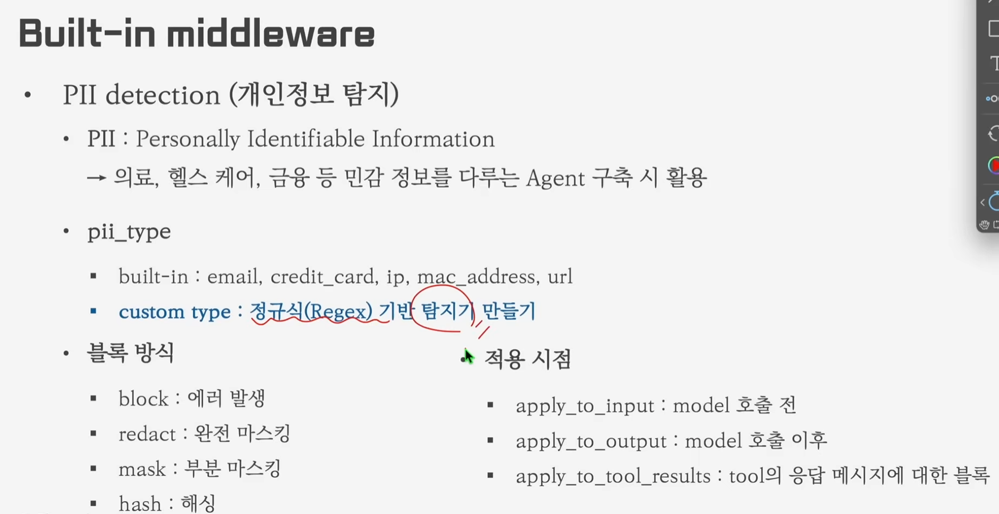
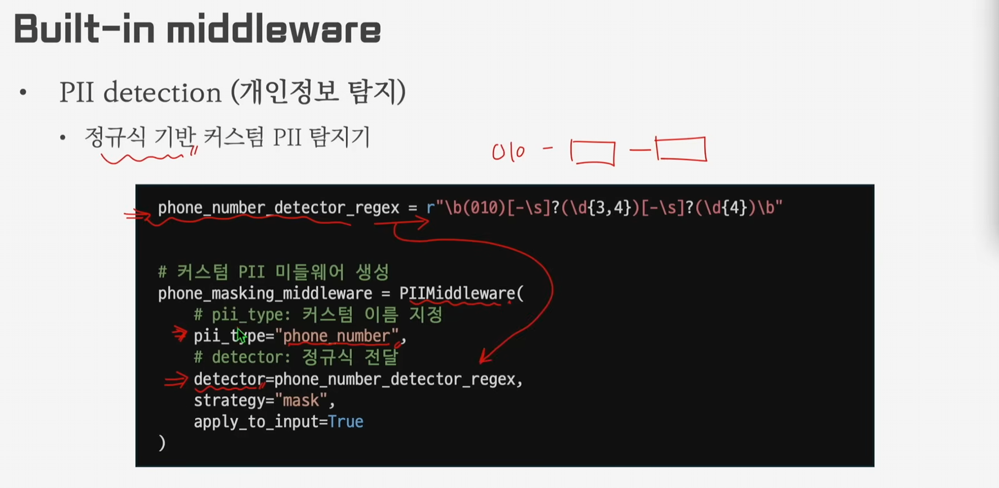

In [74]:
from langchain.agents import create_agent
from langchain.chat_models import init_chat_model
from langchain.tools import tool
from langchain.agents.middleware import PIIMiddleware, LLMToolEmulator


@tool
def save_customer_feedback(feedback: str)-> str:
    """
    고객 피드백을 저장하는 도구입니다.
    """
    return f"✅ 고객 피드백이 성공적으로 저장되었습니다. : {feedback[:50]}..."

phone_number_detector_regex = r"\b(010)[-\s]?(\d{3,4})[-\s]?(\d{4})\b"

# 커스텀 PII 미들웨어 생성
phone_masking_middleware = PIIMiddleware(
    # pii_type: "phone_number" 라는 커스텀 이름 지정
    pii_type="phone_number",

    # detector: 위에서 만든 정규식 전달
    detector=phone_number_detector_regex,

    # strategy: "mask" (마스킹)
    # 마스킹은 기본적으로 마지막 4자리를 제외하고 마스킹
    strategy="mask",

    # apply_to_input: 사용자 입력에 적용
    apply_to_input=True,

)

agent = create_agent(
    tools=[save_customer_feedback],
    model="gpt-5-nano",
    middleware=[phone_masking_middleware],
)

In [75]:
prompt = "안녕하세요, 제 핸드폰 번호는 010-1234-5678 입니다. 등록해주세요."

response = agent.invoke(
    {"messages": [{"role": "user", "content": prompt}]},
)

In [76]:
print(response['messages'][-1].content)

안녕하세요. 요청 주셔서 감사합니다.

- 현재 시스템에서 핸드폰 번호 등록 기능은 지원되지 않아 즉시 등록해 드리지는 못합니다.
- 다만 이 요청은 이미 기록으로 남겨 두었습니다. 향후 기능 개선이나 정책 변경 시 참고될 수 있습니다.

추가로 원하시는 조치가 있으면 알려주세요. 예를 들어:
- 이 요청을 계정 메모로 남겨두기
- 업데이트 소식을 받기 위한 연락 방법(이메일 등) 남겨두기

혹시 더 필요한 사항이나 다른 도움 드릴 수 있는 점이 있을까요?


In [77]:
response

{'messages': [HumanMessage(content='안녕하세요, 제 핸드폰 번호는 ****5678 입니다. 등록해주세요.', additional_kwargs={}, response_metadata={}, id='56a2624c-dfb1-46bd-b74b-b7780cc11ef4'),
  AIMessage(content='', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1407, 'prompt_tokens': 148, 'total_tokens': 1555, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 1344, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuG6oQh57PaiulJu1GsgCQcmy4rx1', 'service_tier': 'default', 'finish_reason': 'tool_calls', 'logprobs': None}, id='lc_run--019b88a9-1e33-7232-bf39-b411831c20b9-0', tool_calls=[{'name': 'save_customer_feedback', 'args': {'feedback': '고객 요청: 핸드폰 번호 등록 요청. 번호 끝자리 5678. 현재 시스템에서 핸드폰 번호 등록 기능은 지원되지 않아 요청을 로그로 남김.'}, 'id': 'call_k4fU9bgkt4ID8gIvOy1WmMRh'

In [15]:
from langchain.agents import create_agent
from langchain.chat_models import init_chat_model
from langchain.tools import tool
from langchain.agents.middleware import PIIMiddleware, LLMToolEmulator


@tool
def save_customer_feedback(feedback: str)-> str:
    """
    고객 피드백을 저장하는 도구입니다.
    """
    return f"✅ 고객 피드백이 성공적으로 저장되었습니다. : {feedback[:50]}..."

agent = create_agent(
    tools=[save_customer_feedback],
    model="gpt-5-nano",
    middleware=[
        LLMToolEmulator(
                model="gpt-5-nano"),
        # 이메일 주소는 전부 마스킹 처리
        PIIMiddleware("email", strategy="redact", apply_to_input=True),

        # 카드번호는 마지막 4자리만 남기고 나머지 마스킹 처리
        PIIMiddleware("credit_card", strategy="mask", apply_to_input=True),

        # CUSTOM -> API_KEY 형태 ( sk-로 시작하는 32자리 )는 감지되면 실행중단 ()
        PIIMiddleware("api_key", 
                      detector=r"sk-[A-Za-z0-9]{32}",
                      strategy="block", # 에러반환
                      apply_to_input=True,
        )
        ],
)

In [16]:
prompt = "내 API 키는 sk-1234567890abcdef1234567890abcdef 입니다. 이 키로 결제 진행해주세요."
response = agent.invoke(
    {"messages": [{"role": "user", "content": prompt}]},
)

PIIDetectionError: Detected 1 instance(s) of api_key in text content

# Summarization (요약)
- 다중턴 에이전트를 구현할 때 사용 
- 여러 입력과 여러 출력 -> ai 모델이 쌓인 내용을 요약하는것 (특정 토큰수와 메모리가 차는 경우 사용)
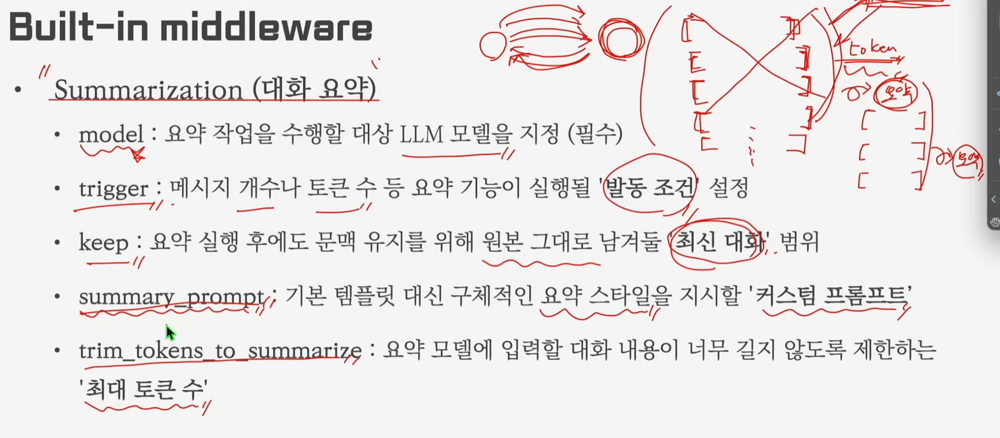
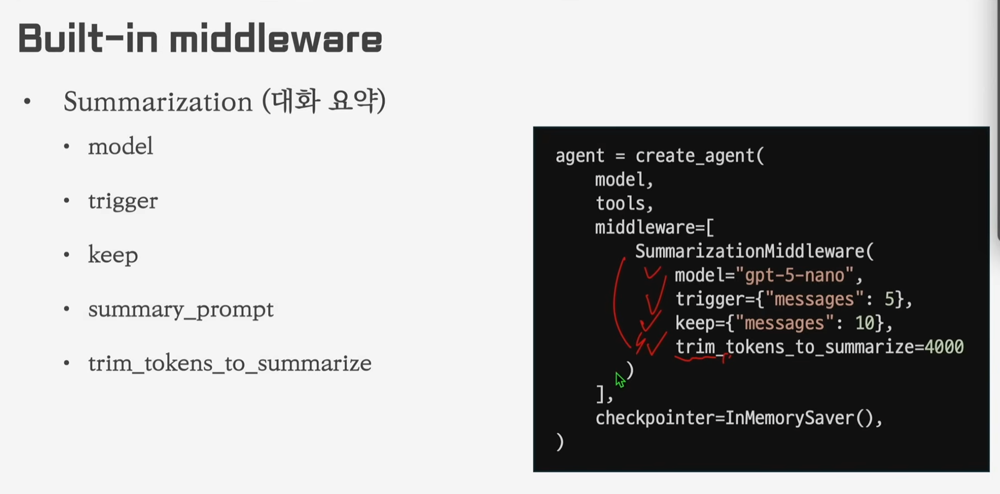


In [37]:
#### Summarize Memory
from langchain.agents import create_agent
from langchain.chat_models import init_chat_model
from langchain.tools import tool
from langchain.agents.middleware import PIIMiddleware, LLMToolEmulator, SummarizationMiddleware
from langgraph.checkpoint.memory import InMemorySaver

agent = create_agent(
    model,
    # tools,
    checkpointer=InMemorySaver(),
    middleware=[
        SummarizationMiddleware(
            model="gpt-4o-mini",
            trigger=("messages",1),
            keep=("messages", 10),
            trim_tokens_to_summarize=4000
        )
    ],
)

# "tokens", 4000)



In [38]:
result = agent.invoke(
    {"messages": [{"role": "user", "content": "안녕하세요! 저는 Jay입니다."}]},
    {"configurable": {"thread_id": "4"}}
)
print(result["messages"][-1].content)

안녕하세요, Jay님! 만나서 반가워요. 무엇을 도와드릴까요?

- 한국어 공부 도와주기(대화 연습, 발음, 문법 설명 등)
- 번역이나 글쓰기 교정
- 코딩이나 기술 문제 해결
- 공부 계획이나 목표 설정
- 여행 정보나 일반 상담 등

원하시는 것이 있으면 바로 시작해볼게요. 예를 들어 간단한 자기소개 연습이나 일상 대화를 함께 연습해볼 수도 있어요. #자기소개 예시
- “안녕하세요, 저는 Jay입니다.”
- 또는 “안녕하세요, 제 이름은 Jay예요.” 

어떤 것을 먼저 해볼까요? 선택지나 구체적인 요청을 알려주시면 바로 도와드리겠습니다.


In [39]:

result = agent.invoke(
    {"messages": [{"role": "user", "content": "저는 AI 강사입니다."}]},
    {"configurable": {"thread_id": "4"}}
)
print(result["messages"][-1].content)

멋지네요, Jay님. AI 강사로서 어떤 도움부터 드리면 될지 함께 맞춰보면 좋겠어요. 아래와 같은 방향으로 맞춤 지원이 가능합니다. 필요하신 부분만 알려주셔도 됩니다.

가능한 도움 범위
- 커리큘럼 설계: 학습자 수준에 맞춘 모듈 구성, 학습 목표, 평가 방식 제안
- 강의 자료 작성: 슬라이드 구조, 핵심 도식, 예제 코드 설명 노트
- 실습 과제/문제은행: 과제 아이디어, 데이터셋 추천, 자동 채점 스크립트/정답 키
- 채점 루브릭 및 피드백 가이드: 루브릭 작성, 피드백 체크리스트
- 프로젝트 아이디어 및 데모: 실제 모델 구축 프로젝트 아이디어, 발표 자료 가이드
- 윤리·책임 교육 모듈: 편향, 해석가능성, 배포 시 고려사항 모듈
- 도구 및 환경 설정: Python, PyTorch/TensorFlow, Colab/Jupyter, GitHub 흐름 등 추천
- 학습자 참여 전략: 토론형 수업, 실시간 코딩 세션, 피어리뷰 루프 등

초보자용 예시 커리큘럼(4주)
- 주 1: 인공지능의 개요, 데이터 과학의 기초, 파이썬 간단 복습 및 노트북 실습
- 주 2: 머신러닝 핵심 원리, 데이터 전처리, 간단한 분류/회귀 모델 실습(Scikit-Learn)
- 주 3: 신경망의 기초와 PyTorch 입문, 간단한 네트워크 구현 및 손실함수/최적화 이해
- 주 4: 프로젝트 설계 및 발표, 모델 평가 및 윤리/배포 고려사항 토의

필요하신 것에 맞춰 더 구체적으로 맞춰드릴 수 있어요
- 대상 학습자 수준(초급/중급/고급)과 수업 규모
- 사용 도구 및 언어(Python, PyTorch, TensorFlow 등)
- 온라인/오프라인 형식, 수업 시간/주차 수
- 목표 평가 방식(퀴즈/과제/프로젝트 혼합 등)

원하시는 방향이나 특정 주제(예: NLP, 컴퓨터 비전, ML Ops 등)가 있으면 바로 알려주세요. 그에 맞춰 샘플 자료나 커리큘럼 초안, 실습 코드 템플릿 등을 만들어 드리겠습니다.


In [40]:
result = agent.invoke(
    {"messages": [{"role": "user", "content": "저는 서울에 살고 있어요"}]},
    {"configurable": {"thread_id": "4"}}
)
print(result["messages"][-1].content)

멋져요, Jay님. 서울에 거주하신다면 현장 운영이나 현지 자원을 활용해 더욱 실용적인 커리큘럼을 구성할 수 있죠. 아래처럼 몇 가지 아이디어를 제안드려요. 필요하신 부분만 알려주시면 바로 맞춤 자료도 만들어 드릴게요.

현지 활용 아이디어
- 오프라인/온라인 병행 운영: 저녁 시간대(예: 주 2회 2시간)나 주말 집중 수업으로 직장인 학습자도 참여하기 쉽게 구성하기.
- 장소 선택 팁: 접근성이 좋은 지하철역 인근의 공유오피스/스터디룸, 카페형 학습 공간을 활용. 지역 커뮤니티 센터나 대학 부속 강의실도 고려.
- 학습자 구성에 맞춘 모듈 설계: 직장인 대상(실무 적용 중심), 대학생/신입 개발자 대상(기초-응용 순서), 현업 재직자 대상(프로젝트 기반).

서울 특화 자원과 참고점
- 한국어 데이터셋과 한국어 NLP 자료를 활용하기 쉬움. 예: 한국어 뉴스 코퍼스, AIHub 공개 데이터 등.
- 지역 커뮤니티 및 모임 활용: 서울 지역의 AI/ML 스터디 모임이나 기술 컨퍼런스 정보를 찾아 네트워킹 및 실습 파트너를 확보하기 좋습니다. (온라인 검색이나 Meetups, 대학 커뮤니티를 통해 파트너를 찾는 방법을 함께 도와드릴 수 있어요.)
- 협력 가능성: 인근 대학교(예: 서울대, 연세대, 고려대)나 연구기관과의 협력 강의, 기업 대상 워크숍 아이디어도 구체화 가능.

바로 시작하기 위한 제안
- 4주 초보자 커리큘럼 예시(현지 운영에 맞춘 간단한 조정 가능):
  주1: AI 개요, 데이터 과학 기초, 파이썬 복습 및 노트북 실습
  주2: 머신러닝 핵심 원리, 데이터 전처리, 간단한 분류/회귀 모델 실습(Scikit-Learn)
  주3: 신경망의 기초 및 PyTorch 입문, 기본 네트워크 구현과 손실/최적화 이해
  주4: 프로젝트 설계 및 발표, 모델 평가와 윤리/배포 고려사항 토론
- 운영 체크리스트: 학습자 프로필 파악(초급/중급/고급), 형식(온라인/오프라인), 수업 시간표, 예산, 평가 방식(퀴즈/과제/프로젝트 혼합) 등을 먼저 정리하면

In [41]:
print(result['messages'])

[HumanMessage(content='안녕하세요! 저는 Jay입니다.', additional_kwargs={}, response_metadata={}, id='79e7b169-762b-448b-a781-76f148e51496'), AIMessage(content='안녕하세요, Jay님! 만나서 반가워요. 무엇을 도와드릴까요?\n\n- 한국어 공부 도와주기(대화 연습, 발음, 문법 설명 등)\n- 번역이나 글쓰기 교정\n- 코딩이나 기술 문제 해결\n- 공부 계획이나 목표 설정\n- 여행 정보나 일반 상담 등\n\n원하시는 것이 있으면 바로 시작해볼게요. 예를 들어 간단한 자기소개 연습이나 일상 대화를 함께 연습해볼 수도 있어요. #자기소개 예시\n- “안녕하세요, 저는 Jay입니다.”\n- 또는 “안녕하세요, 제 이름은 Jay예요.” \n\n어떤 것을 먼저 해볼까요? 선택지나 구체적인 요청을 알려주시면 바로 도와드리겠습니다.', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1009, 'prompt_tokens': 13, 'total_tokens': 1022, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 832, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuWijyLs6isdumffLEGtgp4hX6VvH', 'service_tier': 'default', 'finish_

In [42]:
result['messages']

[HumanMessage(content='안녕하세요! 저는 Jay입니다.', additional_kwargs={}, response_metadata={}, id='79e7b169-762b-448b-a781-76f148e51496'),
 AIMessage(content='안녕하세요, Jay님! 만나서 반가워요. 무엇을 도와드릴까요?\n\n- 한국어 공부 도와주기(대화 연습, 발음, 문법 설명 등)\n- 번역이나 글쓰기 교정\n- 코딩이나 기술 문제 해결\n- 공부 계획이나 목표 설정\n- 여행 정보나 일반 상담 등\n\n원하시는 것이 있으면 바로 시작해볼게요. 예를 들어 간단한 자기소개 연습이나 일상 대화를 함께 연습해볼 수도 있어요. #자기소개 예시\n- “안녕하세요, 저는 Jay입니다.”\n- 또는 “안녕하세요, 제 이름은 Jay예요.” \n\n어떤 것을 먼저 해볼까요? 선택지나 구체적인 요청을 알려주시면 바로 도와드리겠습니다.', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1009, 'prompt_tokens': 13, 'total_tokens': 1022, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 832, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuWijyLs6isdumffLEGtgp4hX6VvH', 'service_tier': 'default', 'finish

In [ ]:
from langchain.agents import create_agent
from langchain.agents.middleware import SummarizationMiddleware


# Single condition: trigger if tokens >= 4000
agent = create_agent(
    model="gpt-4o",
    tools=[your_weather_tool, your_calculator_tool],
    middleware=[
        SummarizationMiddleware(
            model="gpt-4o-mini",
            trigger=("tokens", 4000),
            keep=("messages", 20),
        ),
    ],
)

# Multiple conditions: trigger if number of tokens >= 3000 OR messages >= 6
agent2 = create_agent(
    model="gpt-4o",
    tools=[your_weather_tool, your_calculator_tool],
    middleware=[
        SummarizationMiddleware(
            model="gpt-4o-mini",
            trigger=[
                ("tokens", 3000),
                ("messages", 6),
            ],
            keep=("messages", 20),
        ),
    ],
)

# Using fractional limits
agent3 = create_agent(
    model="gpt-4o",
    tools=[your_weather_tool, your_calculator_tool],
    middleware=[
        SummarizationMiddleware(
            model="gpt-4o-mini",
            trigger=("fraction", 0.8),
            keep=("fraction", 0.3),
        ),
    ],
)

# Custom Middleware
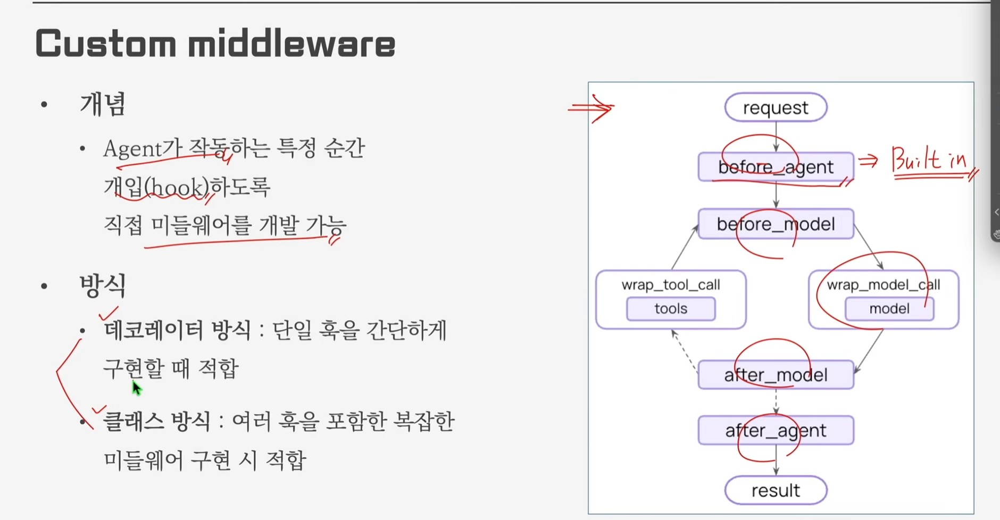

# Structured Outputs
- RDBMS에 집어넣기 위해선 구조화 해야한다.
- Pydantic 사용
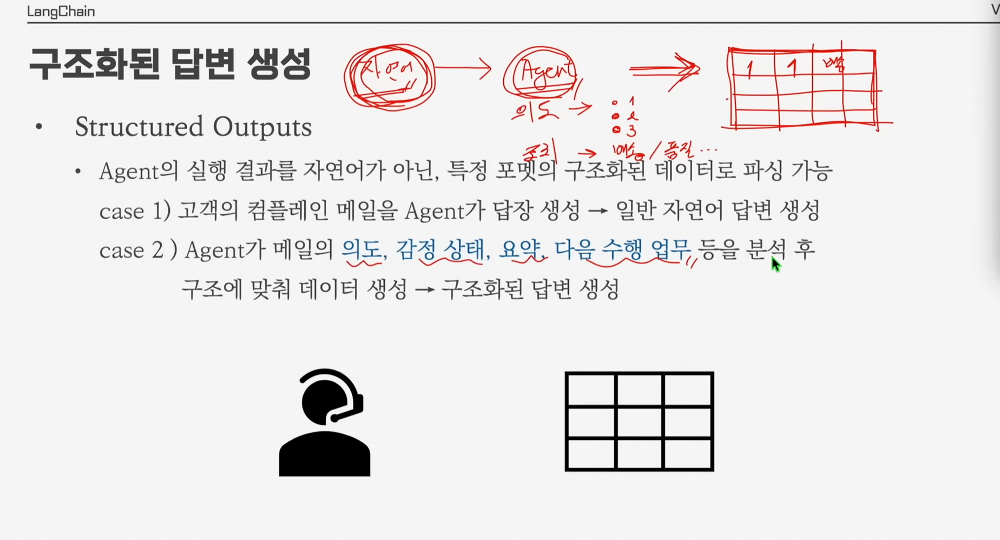
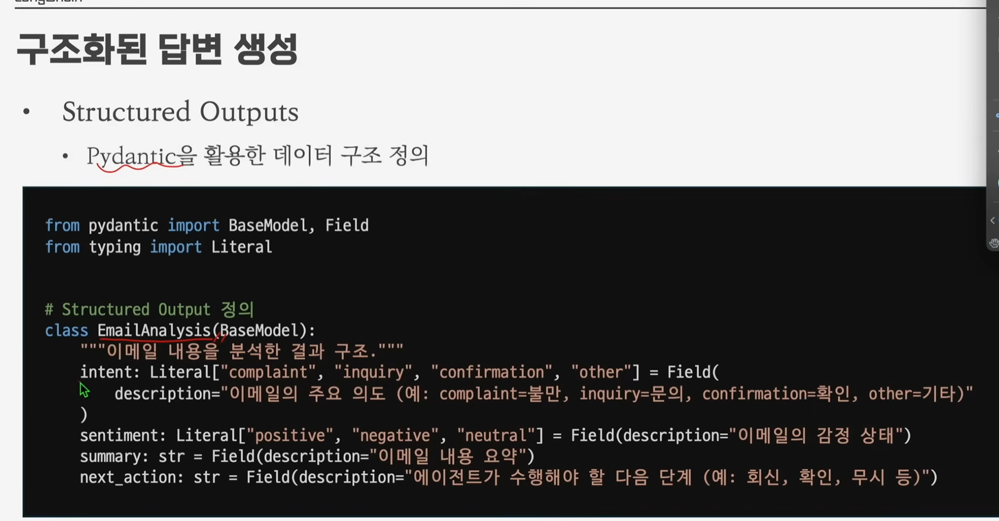
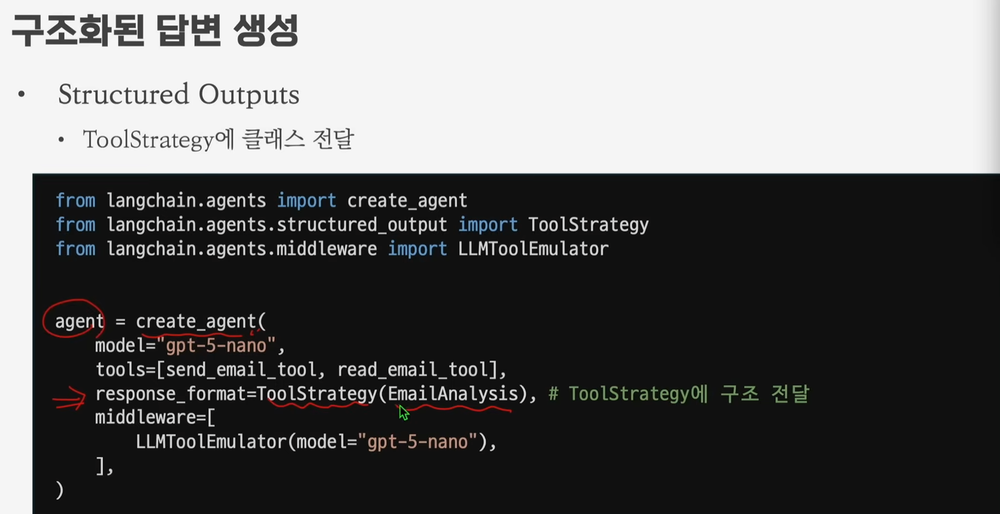

In [43]:
from langchain.tools import tool
from typing import List, Dict


# 이메일 전송 도구
@tool
def send_email_tool(to: str, subject: str, body: str) -> str:
    """
    지정한 이메일 주소로 메일을 보내는 도구입니다.
    """
    return f"✅ 이메일이 성공적으로 전송되었습니다.\n수신자: {to}\n제목: {subject}\n내용: {body[:50]}..."


# 이메일 읽기 도구
@tool
def read_email_tool(limit: int = 3) -> List[Dict[str, str]]:
    """
    고객이 온라인 쇼핑몰에 보낸 컴플레인, 문의, 혹은 확인 관련 이메일 1개를 읽는 도구입니다.
    """
    return f"✅ 이메일이 성공적으로 조회되었습니다."


In [44]:
from pydantic import BaseModel, Field
from typing import Literal

# Structured Output 정의
class EmailAnalysis(BaseModel):
    """이메일 내용을 분석한 결과 구조."""
    intent: Literal["complaint", "inquiry", "confirmation", "other"] = Field(
        description="이메일의 주요 의도 (예: complaint=불만, inquiry=문의, confirmation=확인, other=기타)"
    )
    sentiment: Literal["positive", "negative", "neutral"] = Field(description="이메일의 감정 상태")
    summary: str = Field(description="이메일 내용 요약")
    next_action: str = Field(description="에이전트가 수행해야 할 다음 단계 (예: 회신, 확인, 무시 등)")

In [45]:
from langchain.agents import create_agent
from langchain.agents.structured_output import ToolStrategy
from langchain.agents.middleware import LLMToolEmulator

agent = create_agent(
    model="gpt-5-nano",
    tools=[send_email_tool, read_email_tool],
    response_format=ToolStrategy(EmailAnalysis),
    middleware=[
        LLMToolEmulator(model="gpt-5-nano"),
    ],
)

In [46]:
response = agent.invoke(
    {
        "messages": [
            {"role": "user", "content": "최근 온 메일 확인하고 고객의 의도와 감정, 요약, 그리고 어떤 행동이 필요한지 분석하세요."}
        ]
    }
)

In [47]:
response['structured_response']

EmailAnalysis(intent='complaint', sentiment='negative', summary='주문번호 202401234의 배송이 지연 중이며, 배송 준비 중 상태로 며칠간 업데이트가 없어 걱정됩니다. 배송 예정일과 지연 원인을 구체적으로 알려주고, 지연 기간에 대한 보상 정책이나 대체 옵션(부분 배송, 다른 배송 방법 등)에 대해 안내해 주시길 바랍니다. 이번 주 안으로 배송 예정일을 확정해 주시고, 불가피하다면 환불 절차 진행도 요청합니다. 빠른 회신 부탁드립니다.', next_action='배송 지연 원인과 새로운 배송 일정 안내, 보상 정책 및 대체 옵션 안내, 배송 예정일 확정 혹은 환불 절차 안내, 필요 시 추가 정보 요청(예: 영수증, 배송지 확인)')

In [48]:
response

{'messages': [HumanMessage(content='최근 온 메일 확인하고 고객의 의도와 감정, 요약, 그리고 어떤 행동이 필요한지 분석하세요.', additional_kwargs={}, response_metadata={}, id='8b137542-cfd1-4ca0-9ec5-10c2887f5fe9'),
  AIMessage(content='', additional_kwargs={'refusal': None}, response_metadata={'token_usage': {'completion_tokens': 1049, 'prompt_tokens': 340, 'total_tokens': 1389, 'completion_tokens_details': {'accepted_prediction_tokens': 0, 'audio_tokens': 0, 'reasoning_tokens': 1024, 'rejected_prediction_tokens': 0}, 'prompt_tokens_details': {'audio_tokens': 0, 'cached_tokens': 0}}, 'model_provider': 'openai', 'model_name': 'gpt-5-nano-2025-08-07', 'system_fingerprint': None, 'id': 'chatcmpl-CuWoCMNl9sCIkNQKYSTzeeHIPva2w', 'service_tier': 'default', 'finish_reason': 'tool_calls', 'logprobs': None}, id='lc_run--019b8c7c-60b2-7761-a869-c97ad680f073-0', tool_calls=[{'name': 'read_email_tool', 'args': {'limit': 1}, 'id': 'call_YFXpwNLz2aJePvWdj5t3O2FB', 'type': 'tool_call'}], usage_metadata={'input_tokens': 340, 'output_toke

In [49]:
import re

text = str(response["messages"])

tool_messages = re.findall(r"ToolMessage\(content='(.*?)'", text, re.DOTALL)

for msg in tool_messages:
    print(msg.replace("\n", " "))
response["structured_response"]
print(response["messages"])

From: 박수민 <sunminpark@example.com>\nDate: 2026-01-04 09:42\nSubject: 주문 #20260104001 배송 지연 문의\n\n본문:\n안녕하세요. 2026-01-01에 주문한 상품 [고급 커피메이커]의 배송 관련 문의드립니다. 주문번호 20260104001이며 결제는 완료되었습니다. 배송 예정일은 2026-01-03이었으나 현재까지 배송 조회가 되지 않고 운송장 번호도 받지 못했습니다. 현재 상황과 새로운 배송 일정에 대해 알려주실 수 있을까요? 가능하시다면 오늘 안으로라도 배송 시작 여부를 알려주시면 감사하겠습니다. 또한 이번 주 이내에 도착하지 않는 경우 부분 배송이나 환불 가능 여부도 안내 부탁드립니다.\n\n추가로, 재입고 알림 신청했던 품목의 재고 상황도 확인 부탁드립니다.\n\n감사합니다.\n박수민 드림
Subject: 주문 배송지연 관련 문의(주문번호 202401234)\nFrom: 고객 홍길동 <hongg@example.com>\nDate: 2026-01-05 14:12\n\nBody:\n안녕하세요. 귀사의 온라인 쇼핑몰에서 최근 주문한 상품의 배송 관련 문제로 문의드립니다.\n\n주문번호: 202401234\n상품명: 스마트워치 X\n결제 완료 상태 확인되었으며, 결제 영수증도 첨부합니다.\n\n현재 배송상태가 "배송 준비 중"으로 표시된 채로 며칠째 아무런 업데이트가 없어 걱정됩니다. 배송 예정일이나 왜 지연이 발생하는지 구체적인 사유를 알려주실 수 있을까요? 또한 늦어지는 기간에 대한 보상 정책이나 대체 옵션(부분 배송, 다른 배송 방법 등)에 대한 안내도 부탁드립니다.\n\n가능하시면 이번 주 안으로 배송 예정일을 확정해 주시고, 불가피하다면 환불 절차를 진행해 주시길 바랍니다.\n\n빠른 회신 부탁드립니다. 감사합니다.
[HumanMessage(content='최근 온 메일 확인하고 고객의 의도와 감정, 요약, 그리고 어떤 행동이 필요한지 분석하세요.', additional_kwargs={